In [49]:
import sklearn
import openml as oml
import pickle
import pandas as pd

oml.config.server='https://www.openml.org/api/v1'
oml.config.apikey='' #Enter your OpenML secret key here

# Experiments on the 304 OpenML datasets

In [21]:
cli.study_all_dataset({"Random Forests":sklearn.ensemble.RandomForestClassifier()},limit=1)

--- Try  0 / 1
--- Dataset number  11 ---
Dataset shape : (625, 4)


did                             11
name                 balance-scale
NumberOfInstances            625.0
NumberOfFeatures               4.0
NumberOfClasses                3.0
Name: 11, dtype: object

Testing Random Forests on dataset 11


did                             11
name                 balance-scale
NumberOfInstances            625.0
NumberOfFeatures               4.0
NumberOfClasses                3.0
Name: 11, dtype: object

Complete influences:  50%|████████████████████████████▌                            | 313/625 [00:00<00:00, 1009.91it/s]


KeyboardInterrupt: 

In [4]:
dict_results = pickle.load(open("pickles/dict_results.pkl","rb"))

In [5]:
df_stats, dict_importances = cli.dataframe_from_dict_results(dict_results)

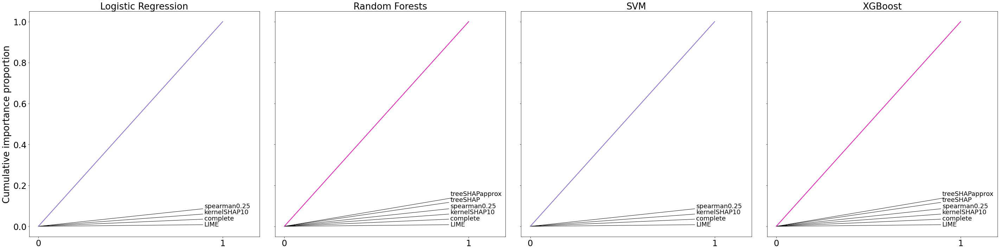

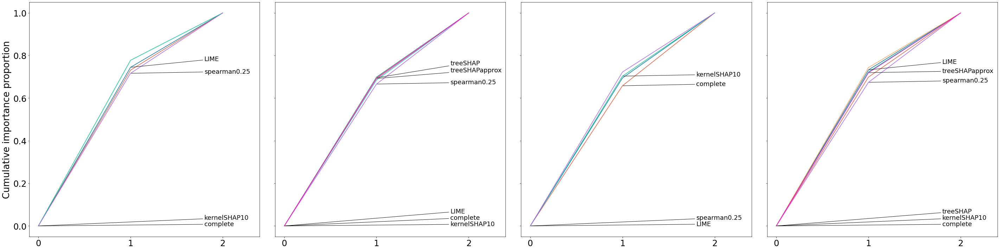

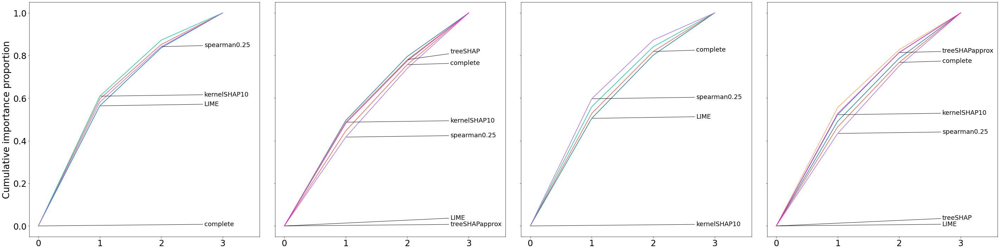

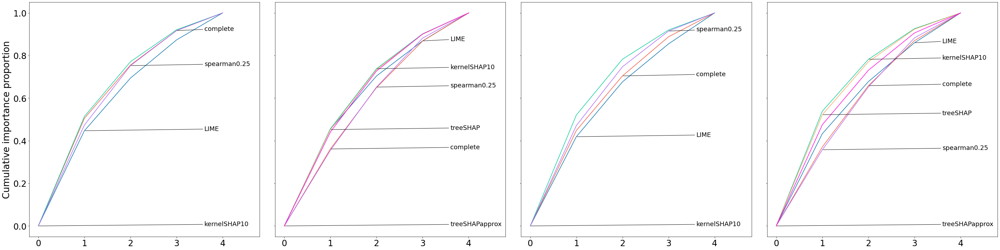

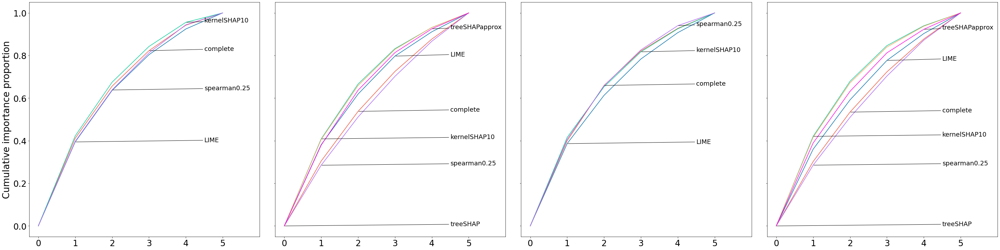

...

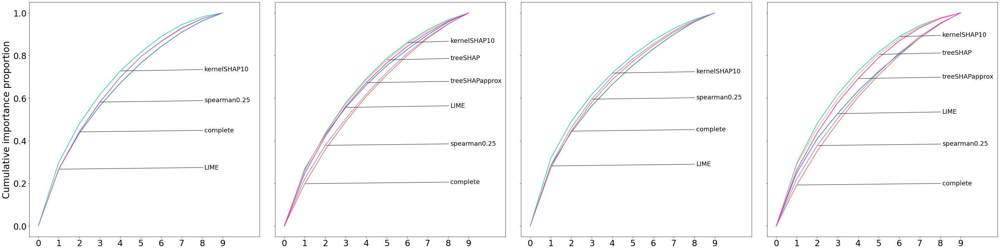

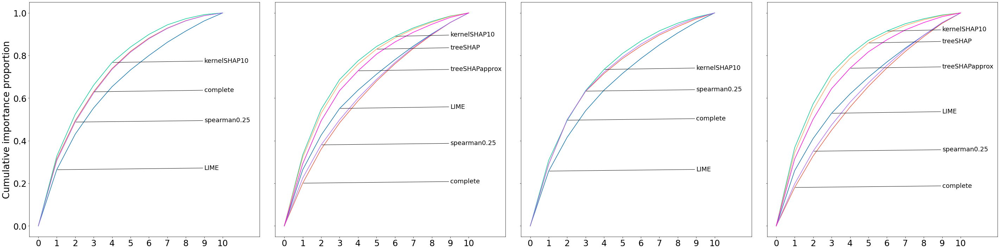

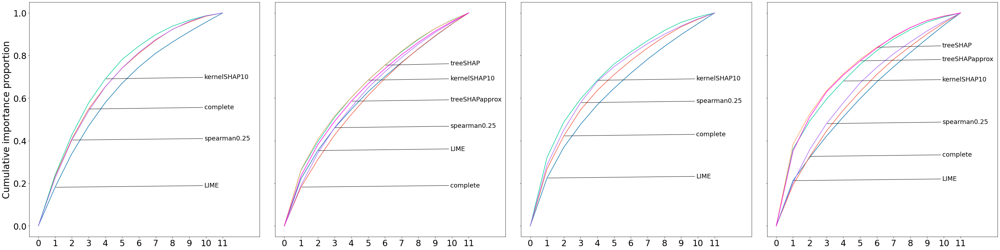

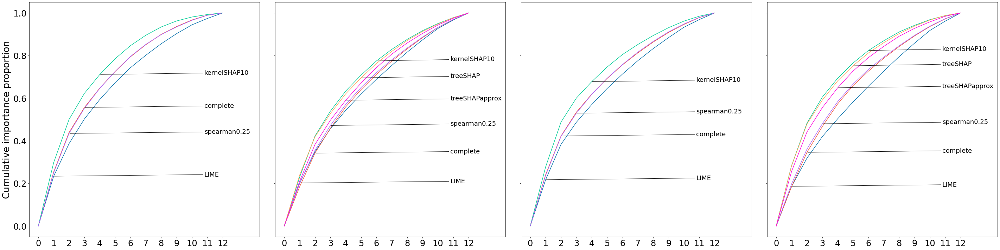

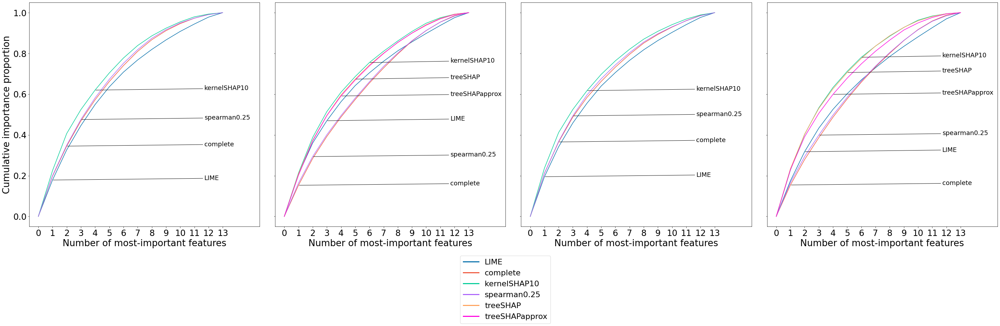

In [24]:
cli.multi_plot_cumulative_importance_methods(df_stats=df_stats, dict_importances=dict_importances)

<font size="5">
    These figures correspond to the exhaustive version of figure 3 from the paper. Here, for each number of features in datasets from 1 to 13, for each predictive model, we plot the mean cumulative importance proportion curve for each method applicable to this model. We summarize all these figures in figure 4 of the paper.
</font>

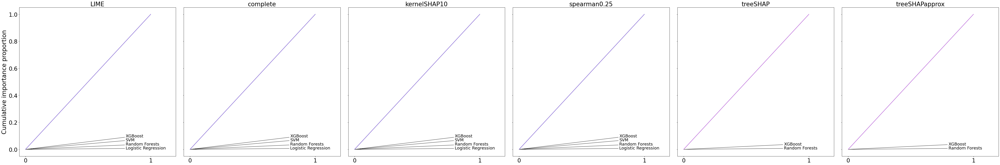

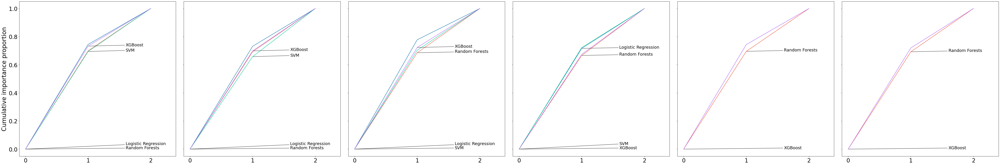

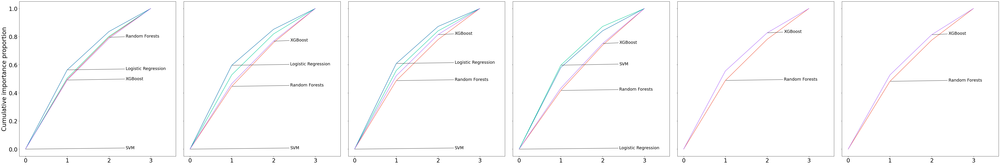

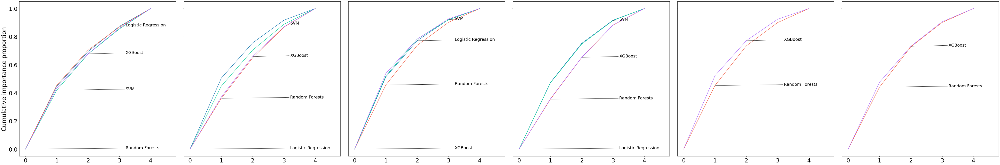

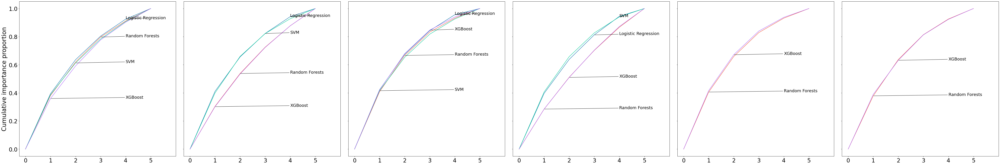

...

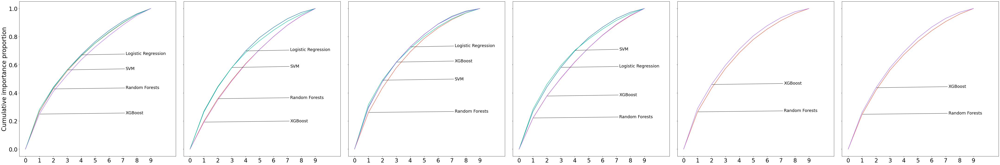

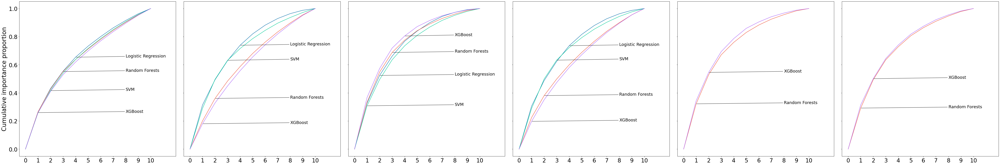

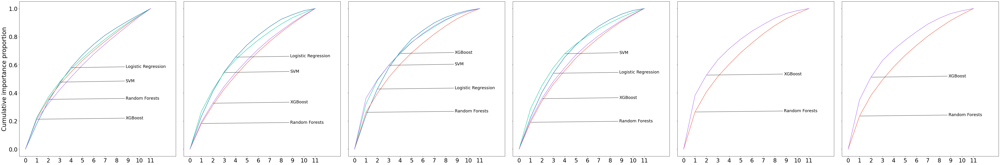

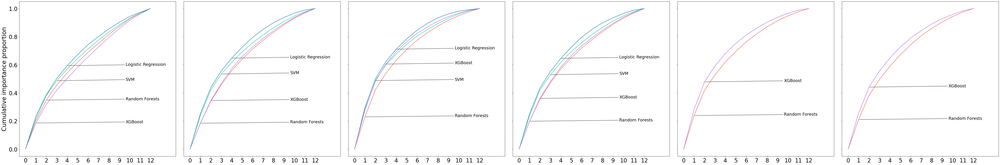

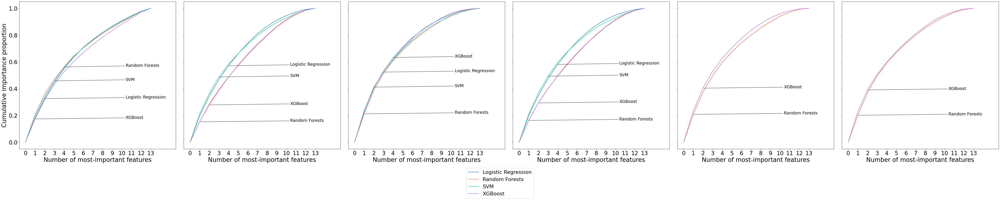

In [35]:
cli.multi_plot_cumulative_importance_models(df_stats=df_stats, dict_importances=dict_importances)

<font size="5">
    These figure represent the same concept but grouped by predictive model instead of explanation method. We summarize all these figures in figure 7 of the paper.
</font>

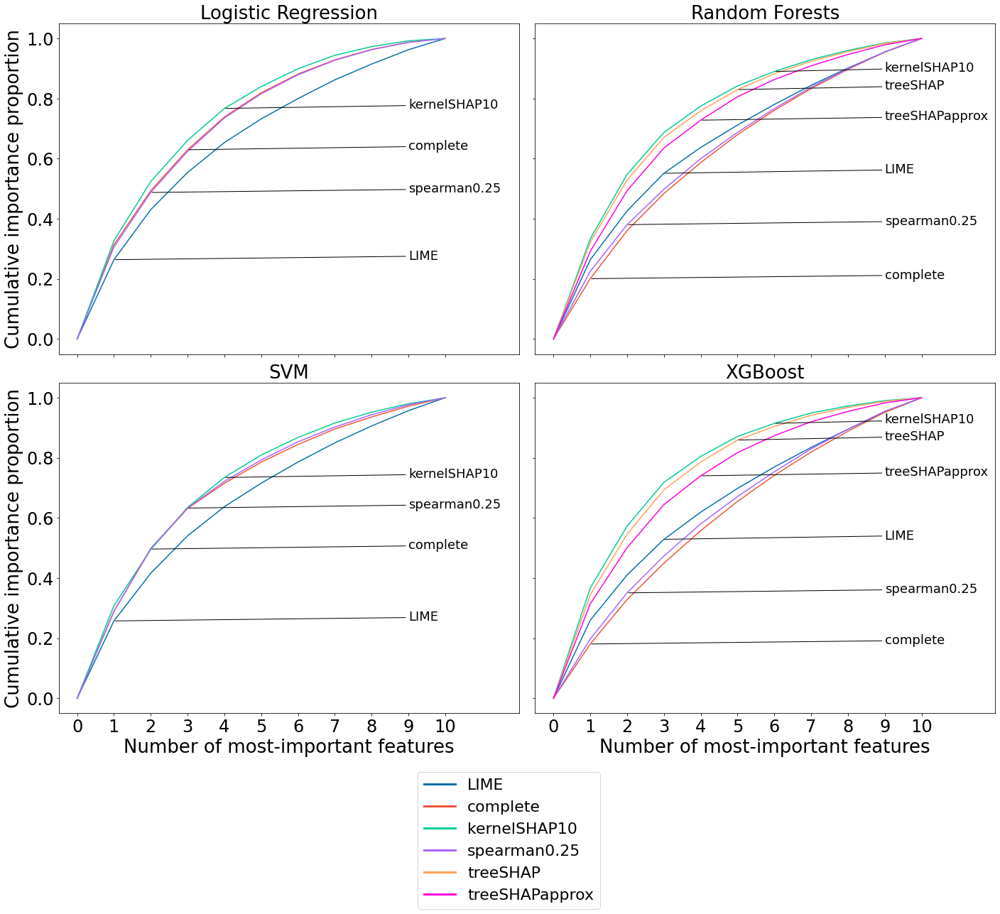

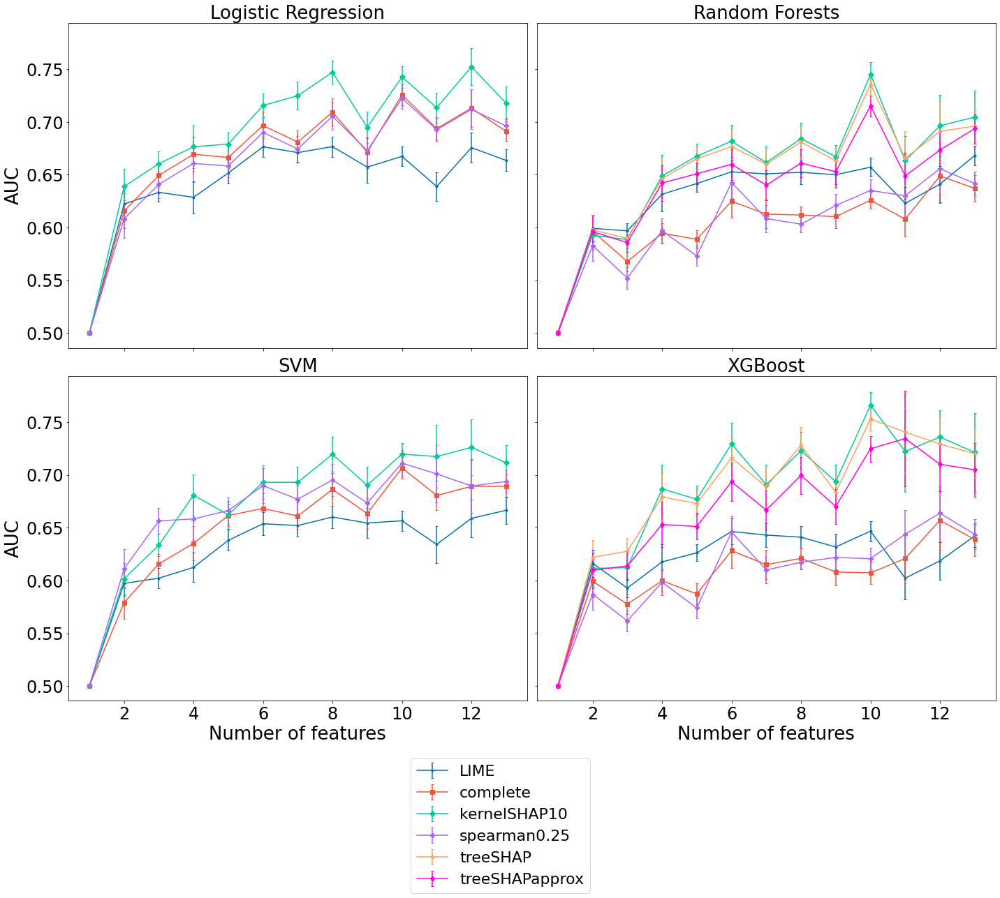

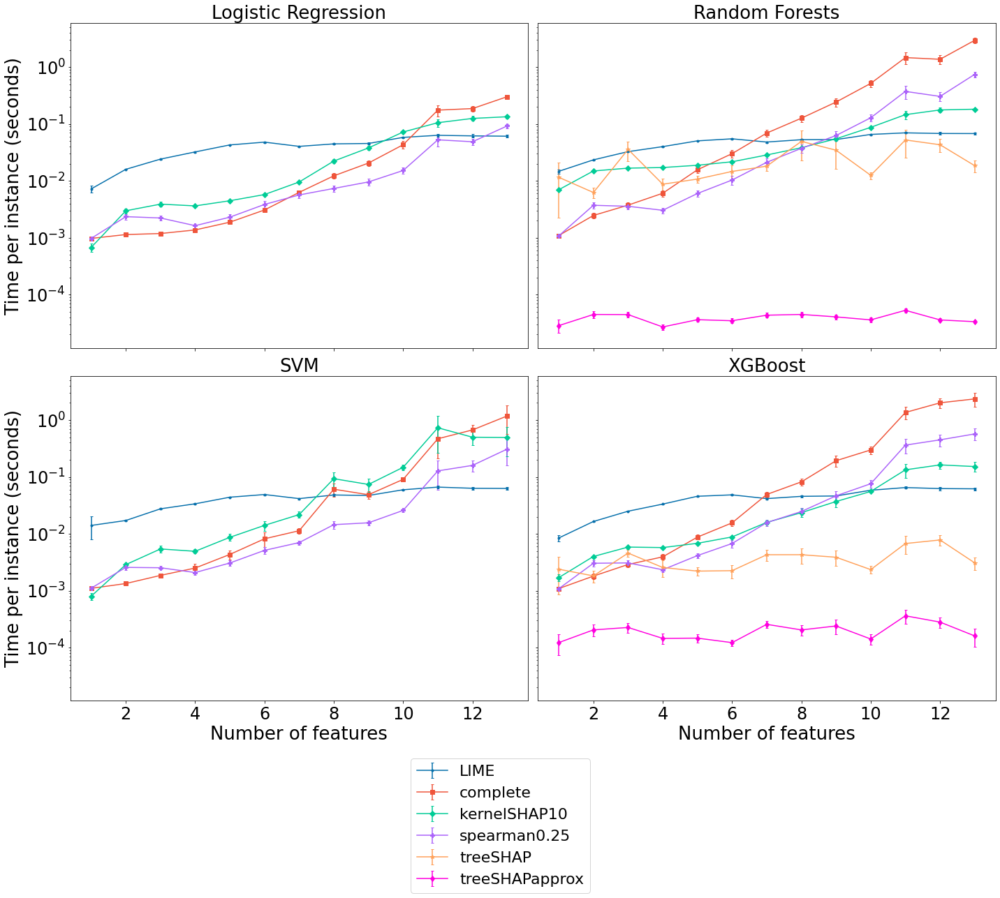

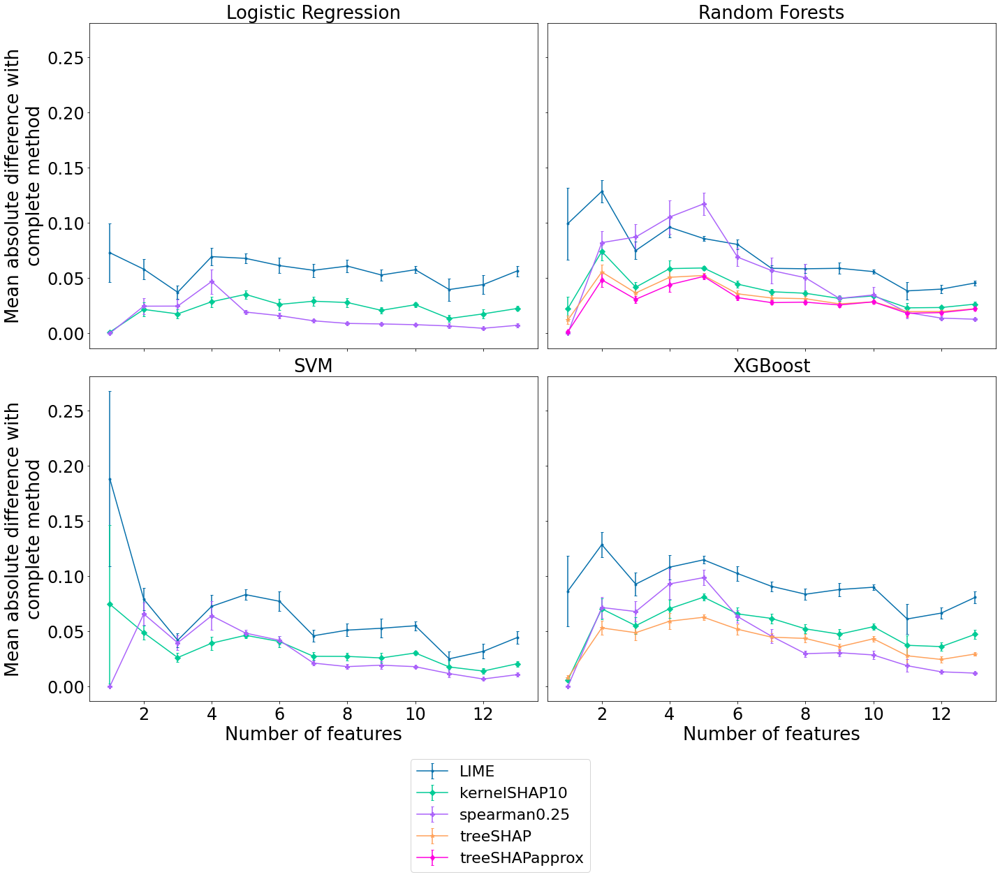

In [23]:
methods.multi_plots_methods(df_stats=df_stats, dict_importances=dict_importances)

<font size="5">
    Figures 1, 2 and 4 of the paper.
</font>

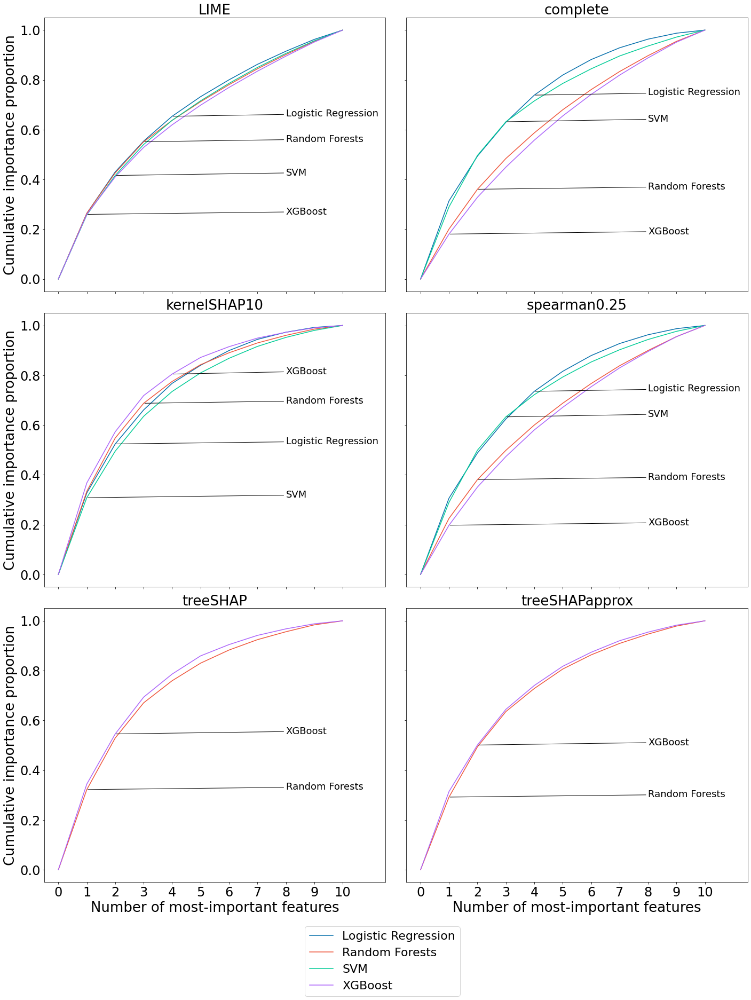

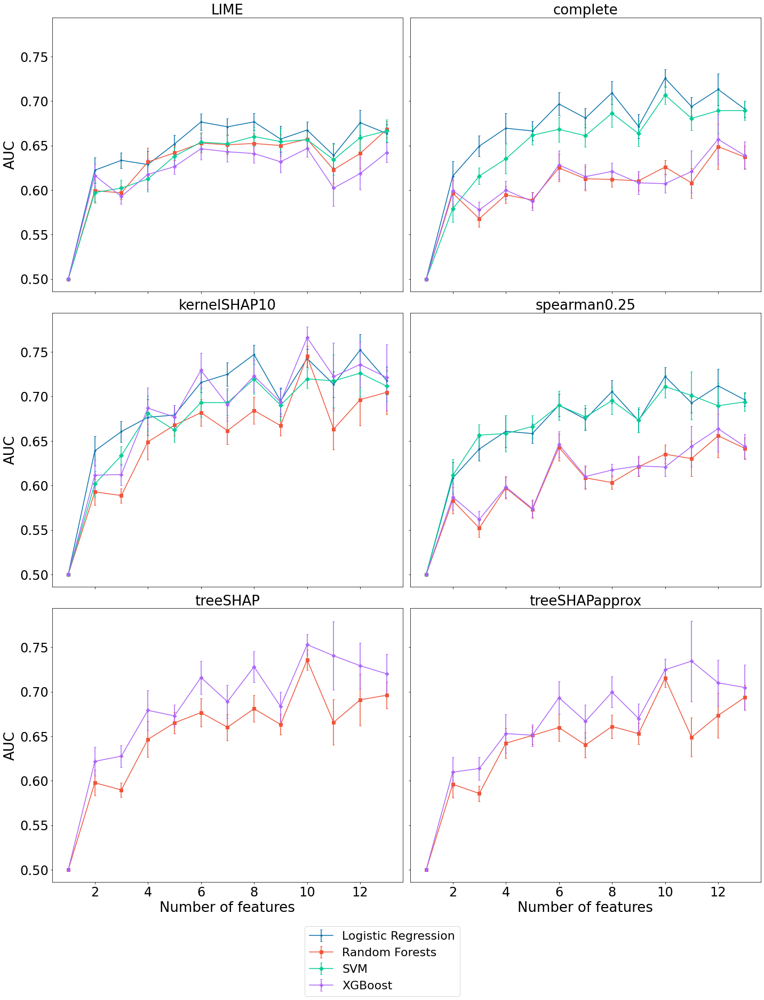

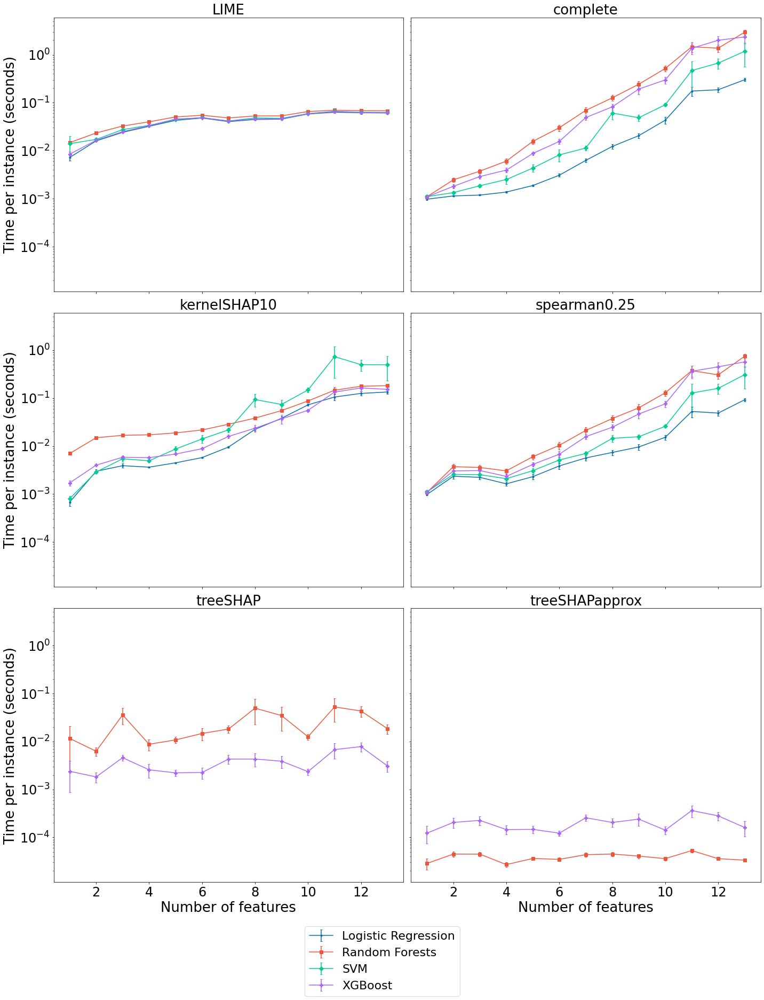

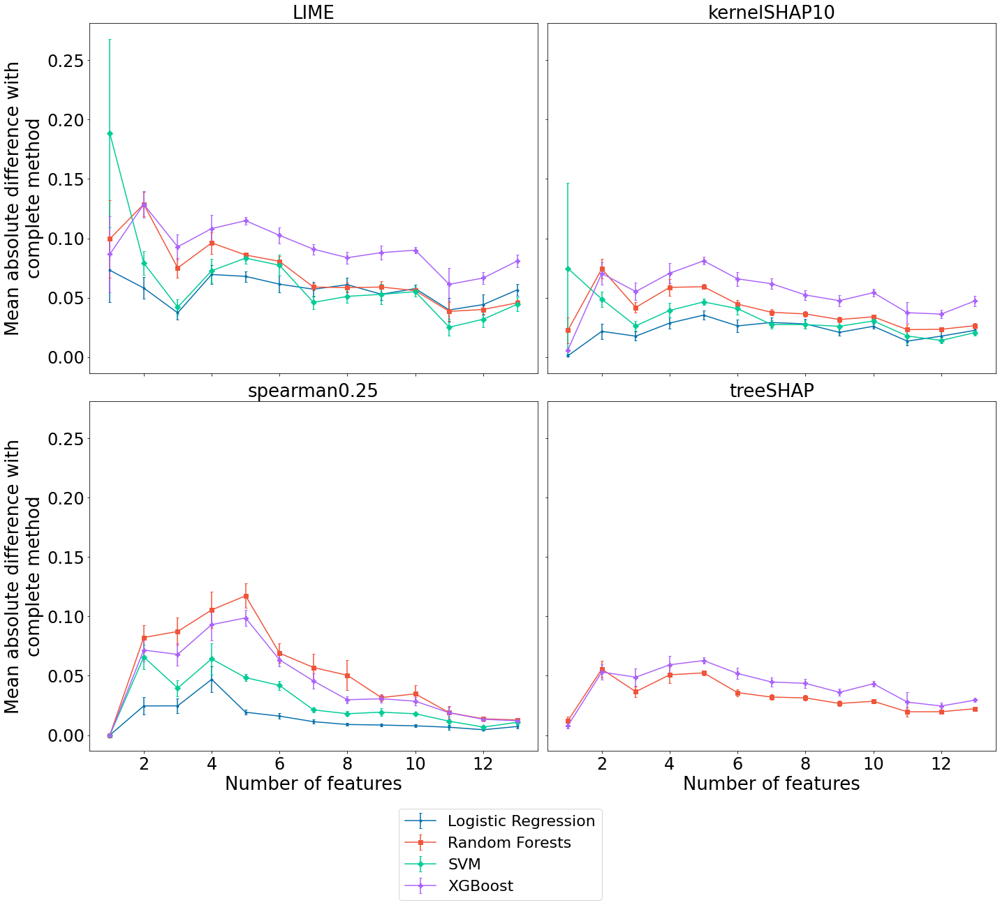

In [29]:
methods.multi_plots_models(df_stats=df_stats, dict_importances=dict_importances)

<font size="5">
    Figures 5, 6 and 7 of the paper
</font>

# Application to SA-Heart

<font size="5">
    For the medical dataset, SA-Heart, we show results for each model. Results for Random Forests are the same than shown in the paper, except that we present all PDPs here.
</font>

In [37]:
dataset = oml.datasets.get_dataset(1498) #SA-Heart
X, y, categorical_indicator, attribute_names = dataset.get_data(
    dataset_format='dataframe',
    target=dataset.default_target_attribute
)
dict_features = {'V1':'systolic blood pressure', 'V2':'cumulative tobacco', 'V3':'low density lipoprotein cholesterol', 'V4':'adiposity', 'V5':'family history of heart disease', 'V6':'type-A behavior', 'V7':'obesity', 'V8':'current alcohol consumption', 'V9':'age'}
X = X.rename(dict_features, axis=1)

X["family history of heart disease"] = X["family history of heart disease"].replace({"1":1,"2":0}).astype(int)
y = y.replace({"1":0,"2":1})    

In [801]:
%%time
models = {"Random Forests":sklearn.ensemble.RandomForestClassifier(),"SVM":sklearn.svm.SVC(probability=True),"Logistic Regression":sklearn.linear_model.LogisticRegression(),"XGBoost":xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss",n_jobs=1)}
dict_bootstrap_0 = dataset_test_bootstrap(2, X, y, models, test_size=0.2, problem_type="Classification", mode="classification", fvoid=None, look_at=1, rate=0.25, n_background_samples=10)

Model not suited for TreeSHAP or kernelSHAP
Model not suited for TreeSHAP or kernelSHAP
Model not suited for TreeSHAP or kernelSHAP
Model not suited for TreeSHAP or kernelSHAP
Wall time: 20min 34s


In [38]:
#pickle.dump(dict_bootstrap_0,open("pickles/results_SA_Heart.pkl", "wb"))
dict_bootstrap_0 = pickle.load(open("pickles/results_SA_Heart.pkl","rb"))

In [39]:
dict_names_reducted = {"cumulative tobacco":"tobacco",
                       "low density lipoprotein cholesterol":"ldlc", 
                       "family history of heart disease":"family",
                       "current alcohol consumption":"alcohol",
                       "systolic blood pressure":"sbp",
                       "type-A behavior":"type-A"}

In [40]:
models = ['Random Forests', 'SVM', 'Logistic Regression', 'XGBoost']
del dict_bootstrap_0['Mean']["XGBoost"]["treeSHAPapprox"]
dict_list_shap_values = {model:[pd.DataFrame(dict_bootstrap_0['Mean'][model][method]["inf"],columns=X.rename(dict_names_reducted, axis=1).columns) for method in dict_bootstrap_0['Mean'][model] if not method.endswith("accuracy")] for model in models}

## Random Forests

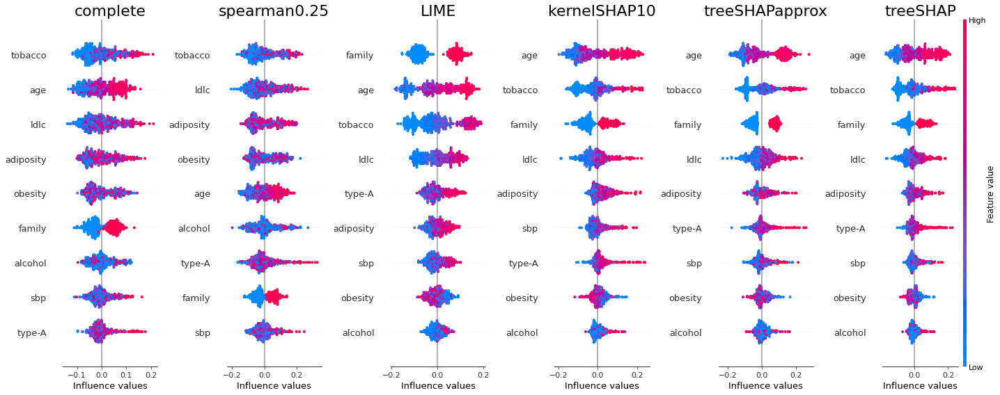

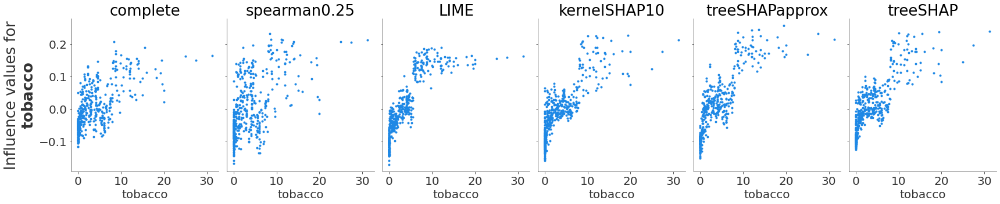

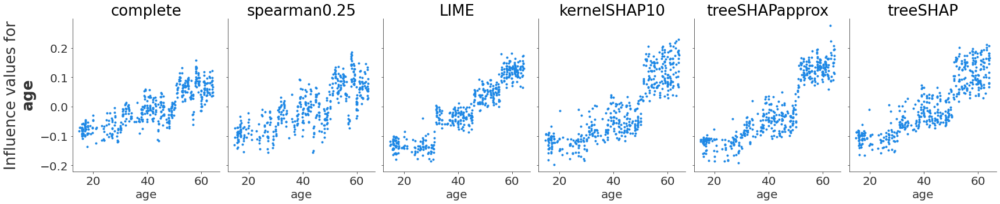

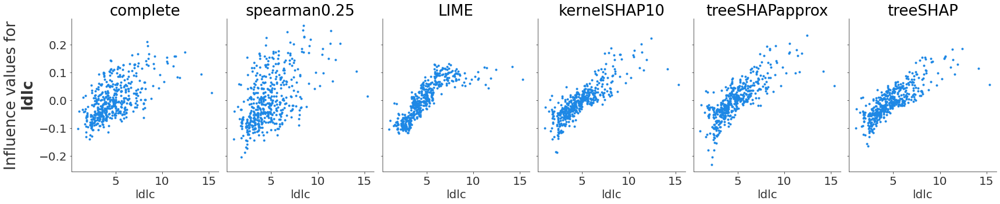

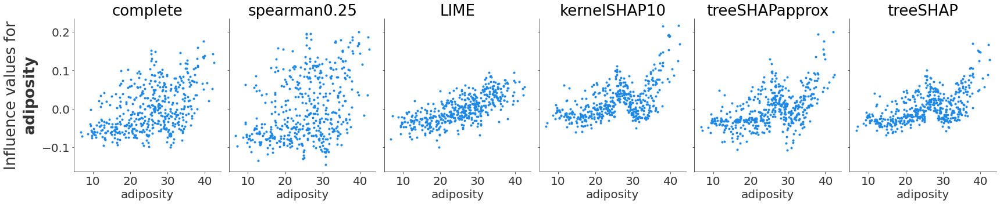

...

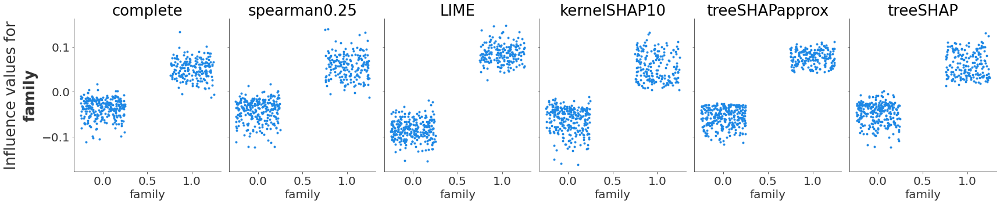

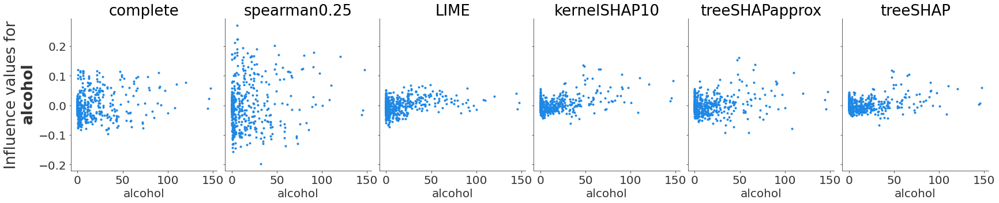

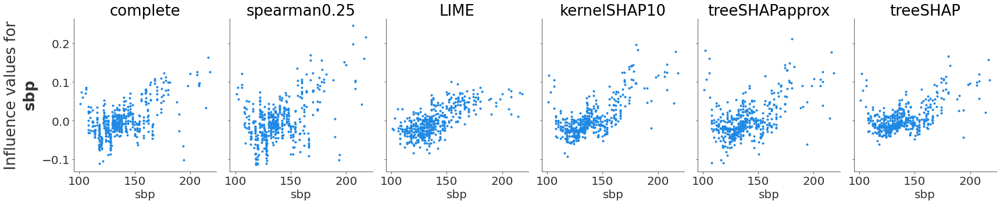

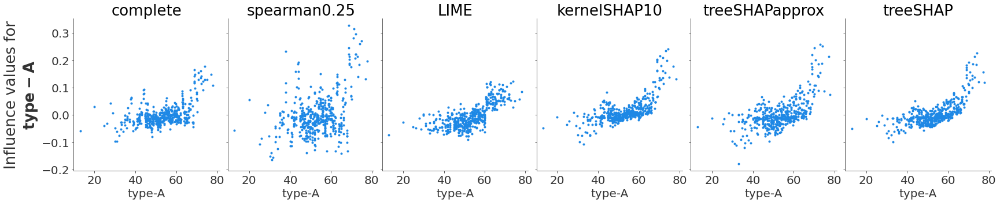

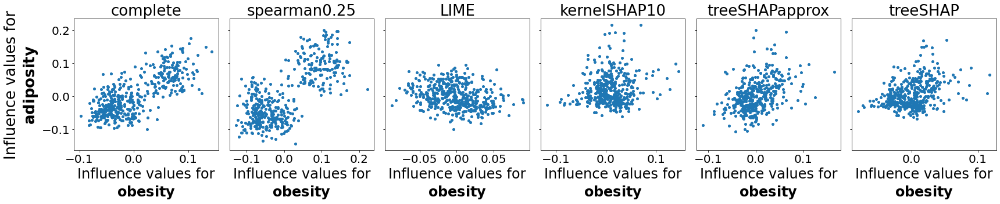

In [45]:
methods = [method for method in dict_bootstrap_0['Mean']["Random Forests"] if not method.endswith("accuracy")]
cli.summary_subplots(dict_list_shap_values["Random Forests"], X.rename(dict_names_reducted, axis=1), list_names=methods)
cli.partial_dependance_plots(dict_list_shap_values["Random Forests"],X.rename(dict_names_reducted, axis=1),list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")
cli.interaction_dependence_plots(dict_list_shap_values["Random Forests"],[('obesity','adiposity')],X,list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")

## XGBoost

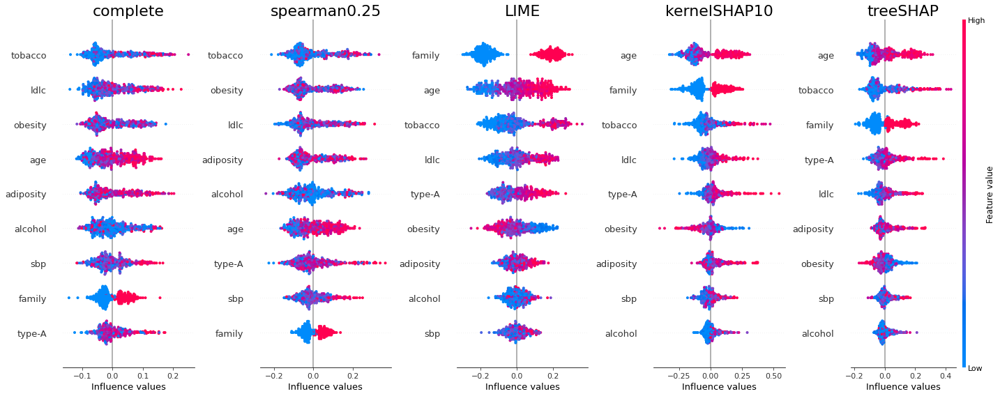

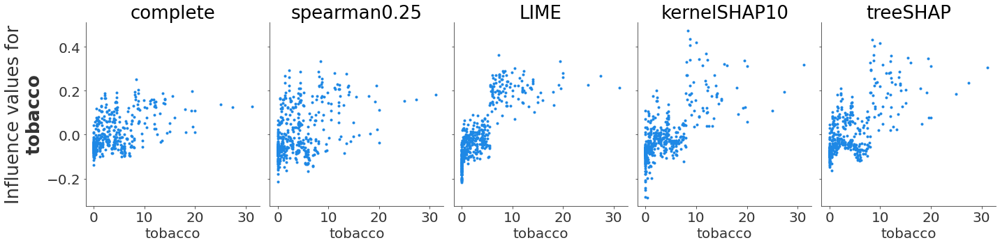

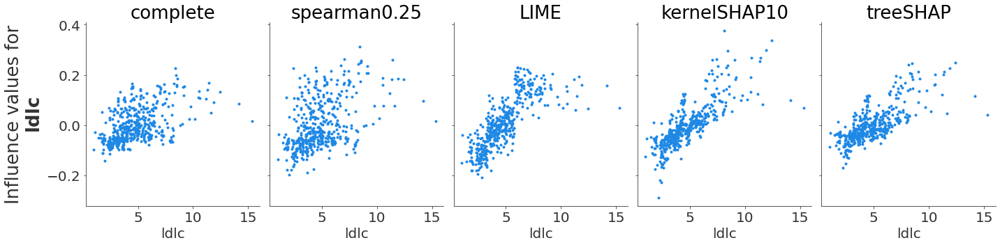

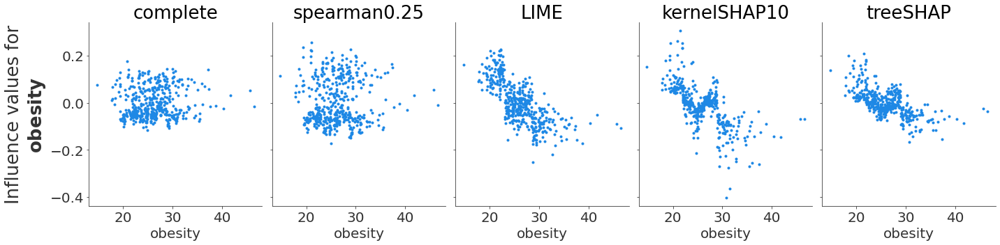

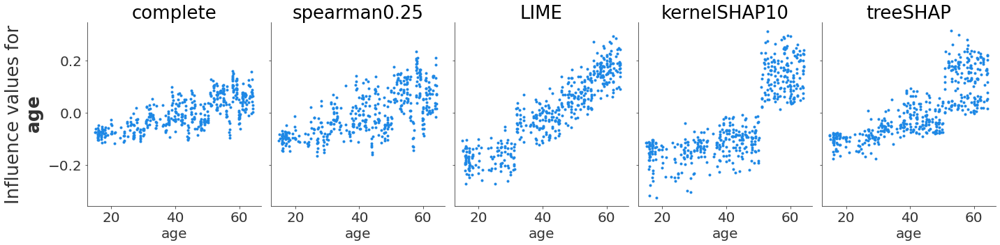

...

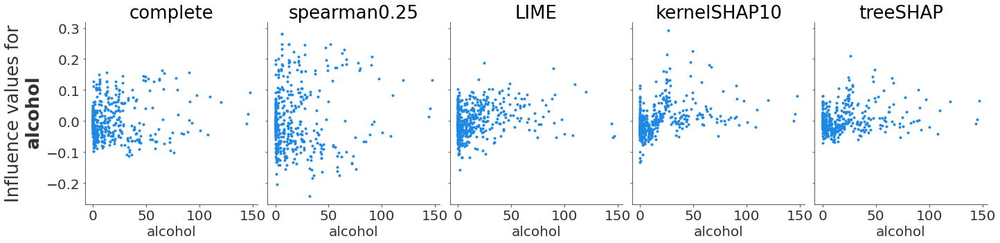

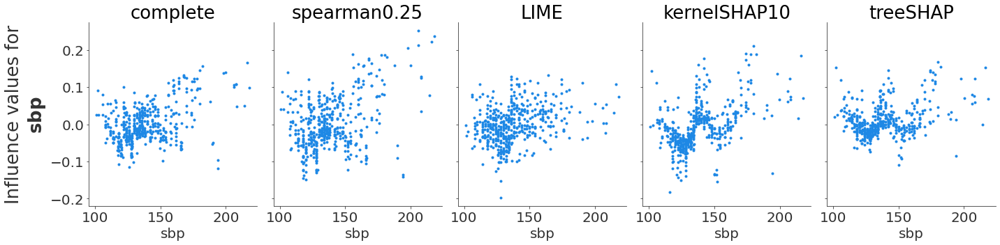

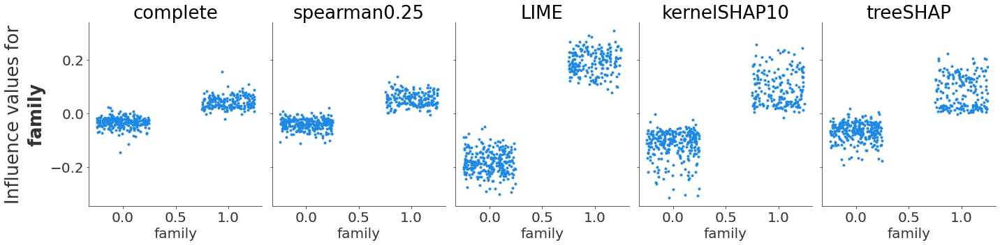

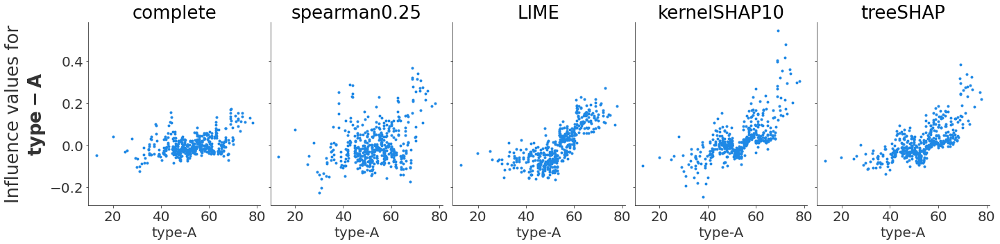

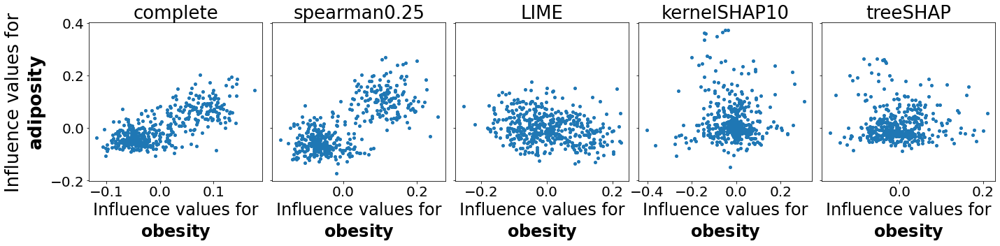

In [46]:
model_name = "XGBoost"
methods = [method for method in dict_bootstrap_0['Mean'][model_name] if not method.endswith("accuracy")]
cli.summary_subplots(dict_list_shap_values[model_name], X.rename(dict_names_reducted, axis=1), list_names=methods)
cli.partial_dependance_plots(dict_list_shap_values[model_name],X.rename(dict_names_reducted, axis=1),list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")
cli.interaction_dependence_plots(dict_list_shap_values[model_name],[('obesity','adiposity')],X,list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")

## SVM

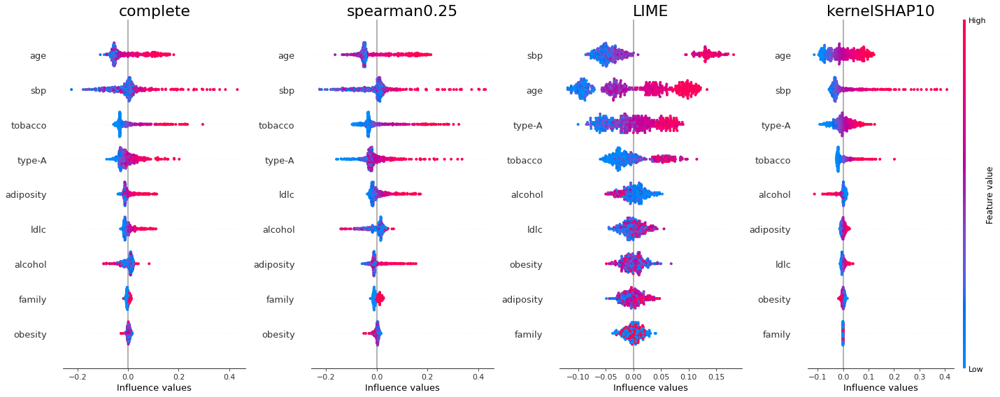

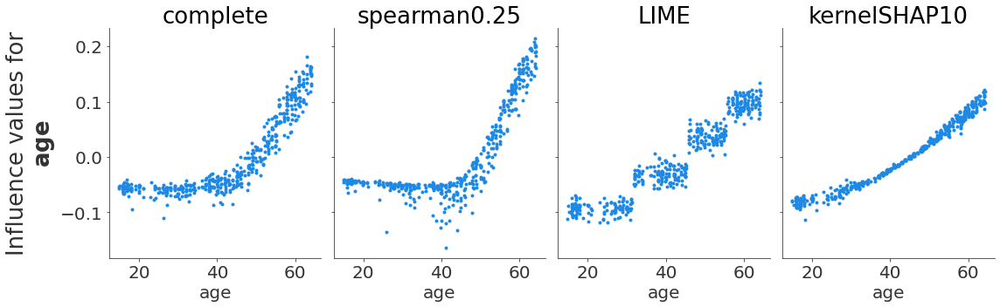

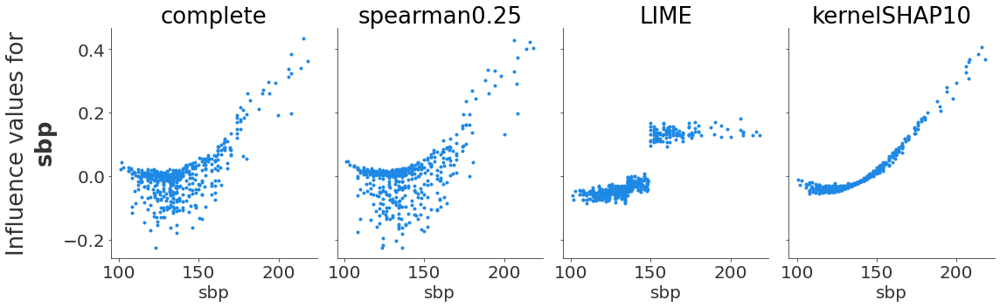

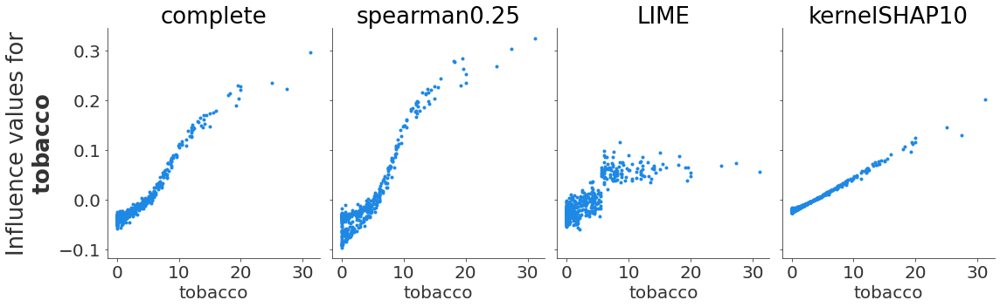

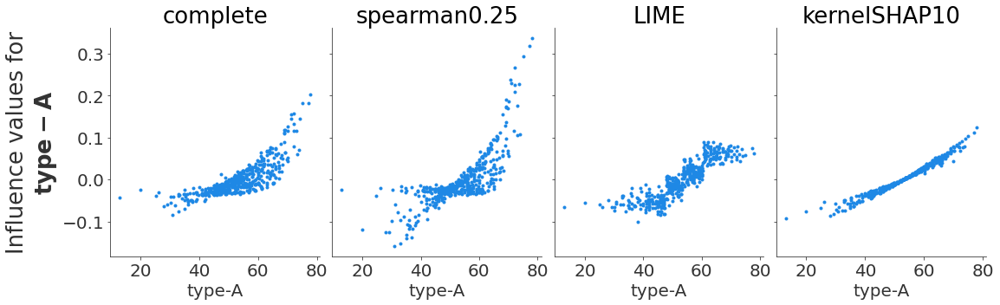

...

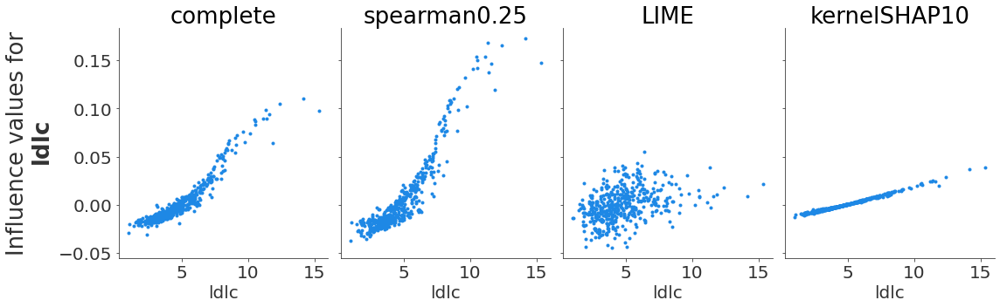

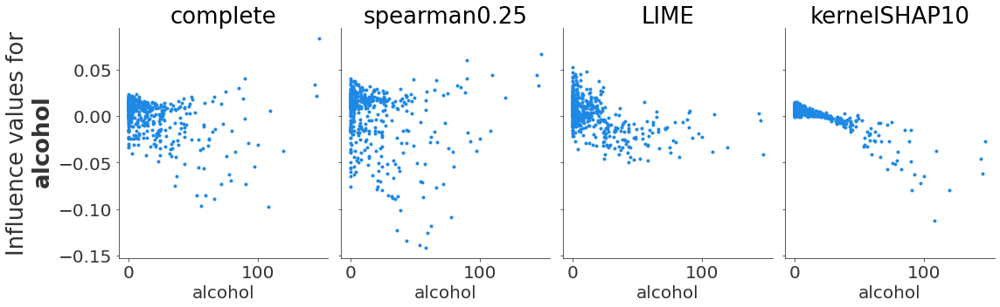

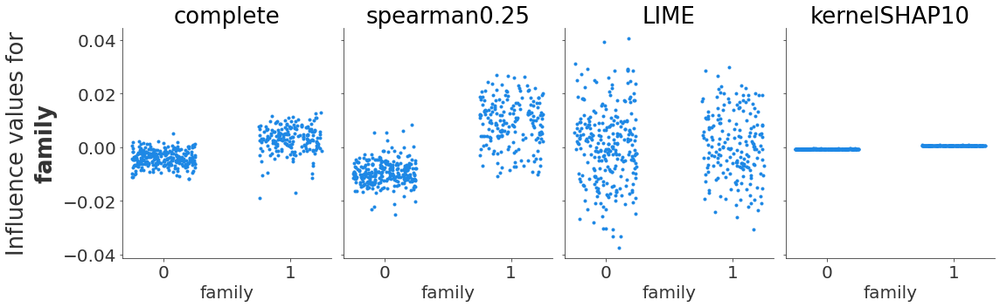

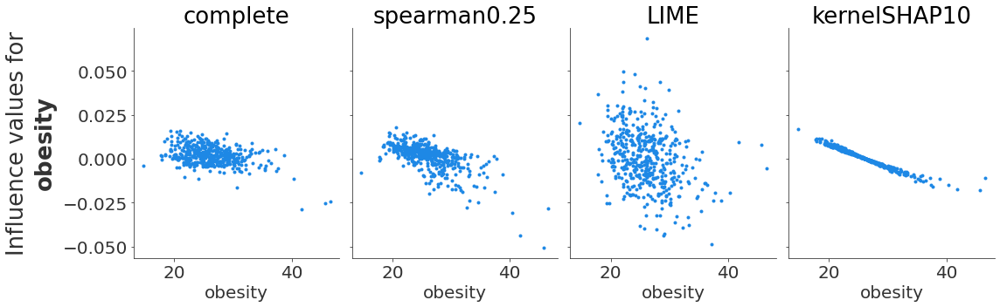

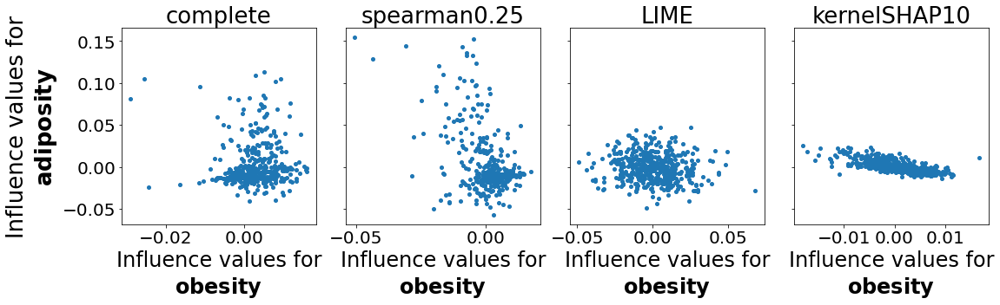

In [47]:
model_name = "SVM"
methods = [method for method in dict_bootstrap_0['Mean'][model_name] if not method.endswith("accuracy")]
cli.summary_subplots(dict_list_shap_values[model_name], X.rename(dict_names_reducted, axis=1), list_names=methods)
cli.partial_dependance_plots(dict_list_shap_values[model_name],X.rename(dict_names_reducted, axis=1),list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")
cli.interaction_dependence_plots(dict_list_shap_values[model_name],[('obesity','adiposity')],X,list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")

## Logistic Regression

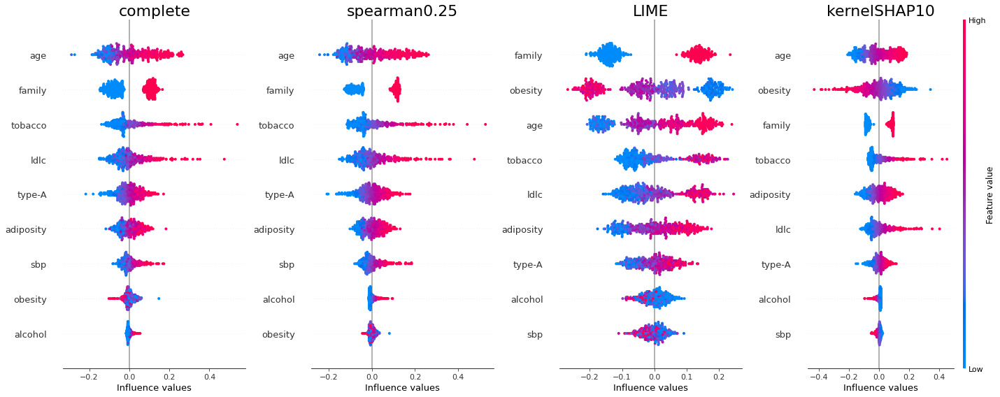

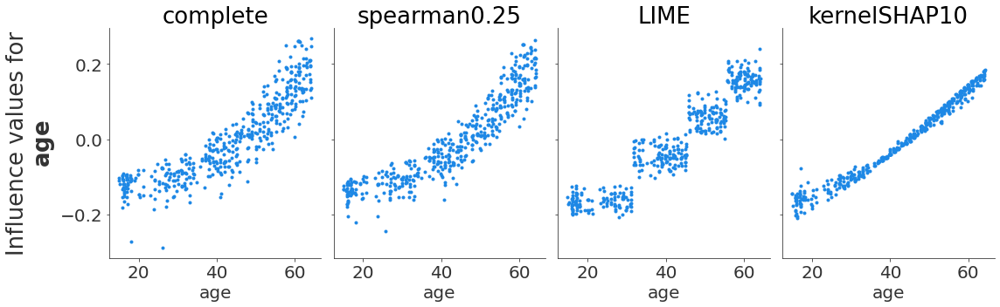

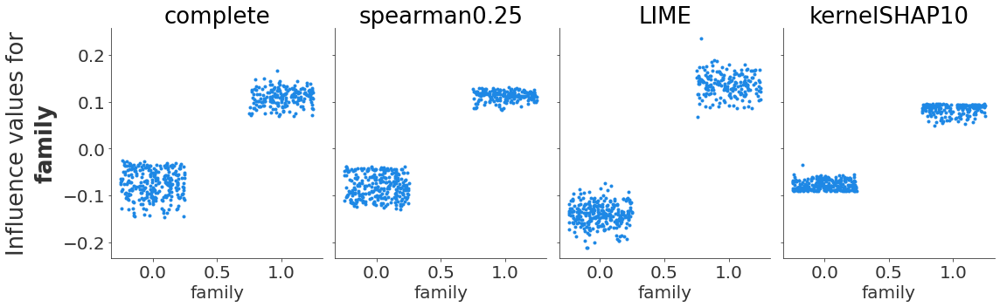

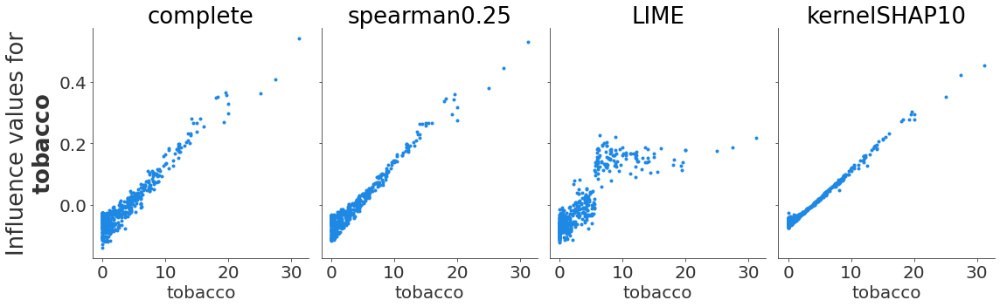

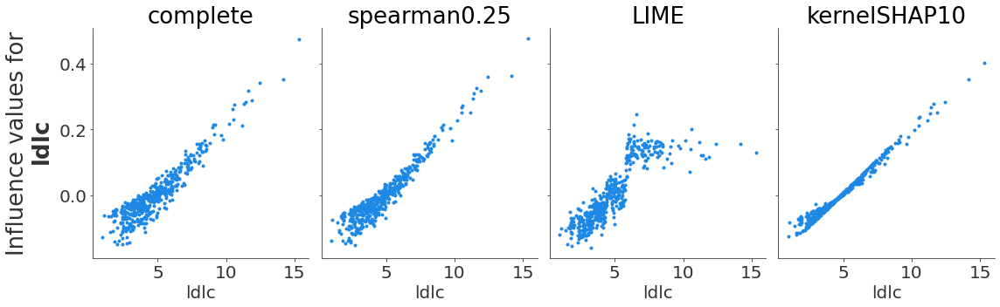

...

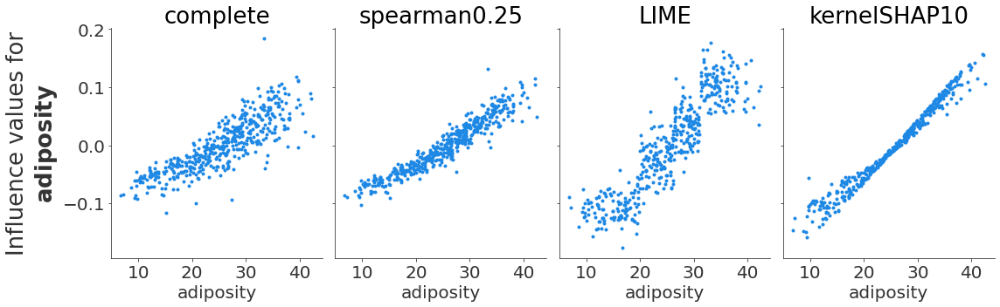

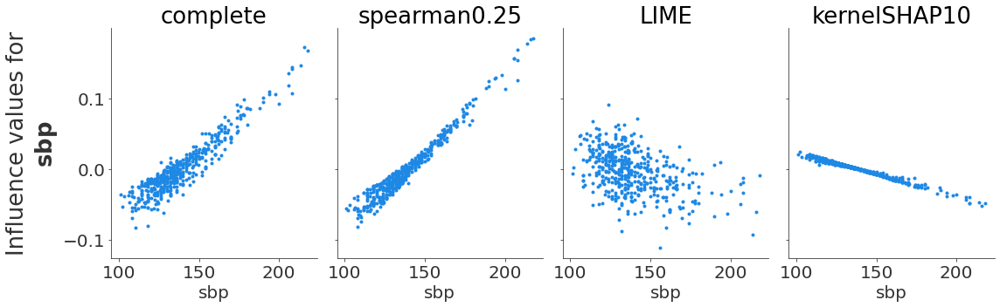

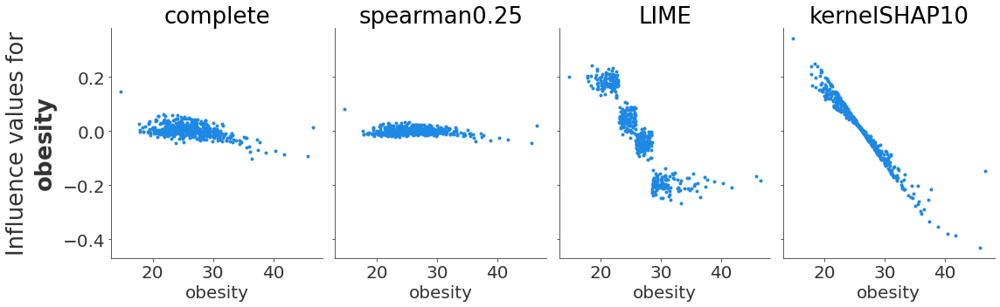

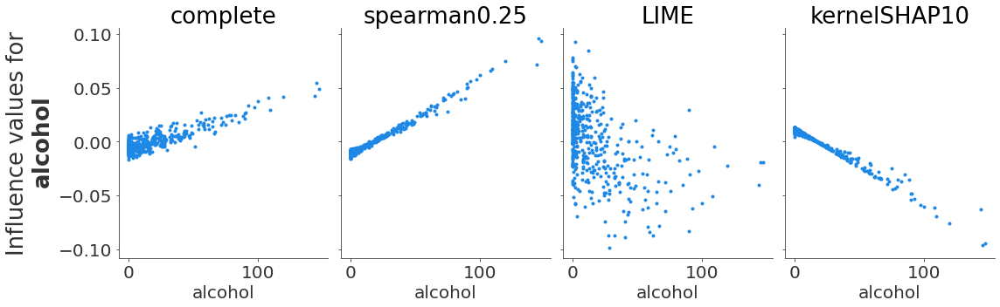

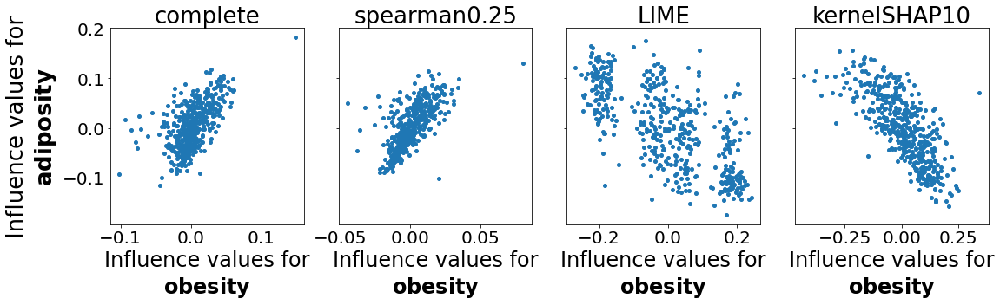

In [48]:
model_name = "Logistic Regression"
methods = [method for method in dict_bootstrap_0['Mean'][model_name] if not method.endswith("accuracy")]
cli.summary_subplots(dict_list_shap_values[model_name], X.rename(dict_names_reducted, axis=1), list_names=methods)
cli.partial_dependance_plots(dict_list_shap_values[model_name],X.rename(dict_names_reducted, axis=1),list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")
cli.interaction_dependence_plots(dict_list_shap_values[model_name],[('obesity','adiposity')],X,list_names=methods)#, save_path="figures/SA_Heart/"+model+"/")